<a href="https://colab.research.google.com/github/puneet-08/projects/blob/main/YOLO_v3_Object_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# YOLO V3 Object Detection

Yolo or 'you look only once' is an object detection algorithm; invented by Joseph Redmon, Santosh Divvala, Ross Girshick and Ali Farhadi in 2015. This algorithm already has 5 different iterations till date. In this notebook we are going to implement version 3.

Yolo applies a single forward pass neural network to the whole image and predicts bounding boxes and probabilites. This algorithm is fast and work in real time as well, meaning could be easly used on vidoes. In this notebook we are going to restrict ourselves to images.

**YOLO v3 Network Architecture**

Yolo v3 architecture is a variant of Darknet architecture known as **Darknet-53**. It utilizes 53 layers for featrue extraction and 53 in addition for the task of detection thereby making **a total of 106 convolution layers**.

Following figure (taken from the research paper) shows the Darknet 53 architecutre in the tablular form -

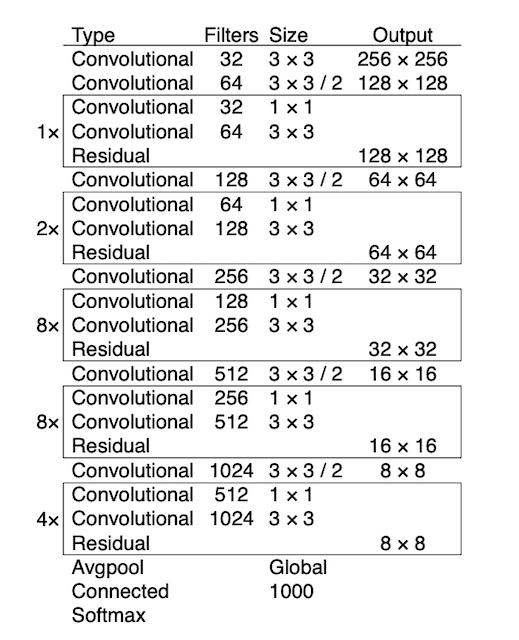

The following figure depicts one of the key concepts behind the object detection algorithm.

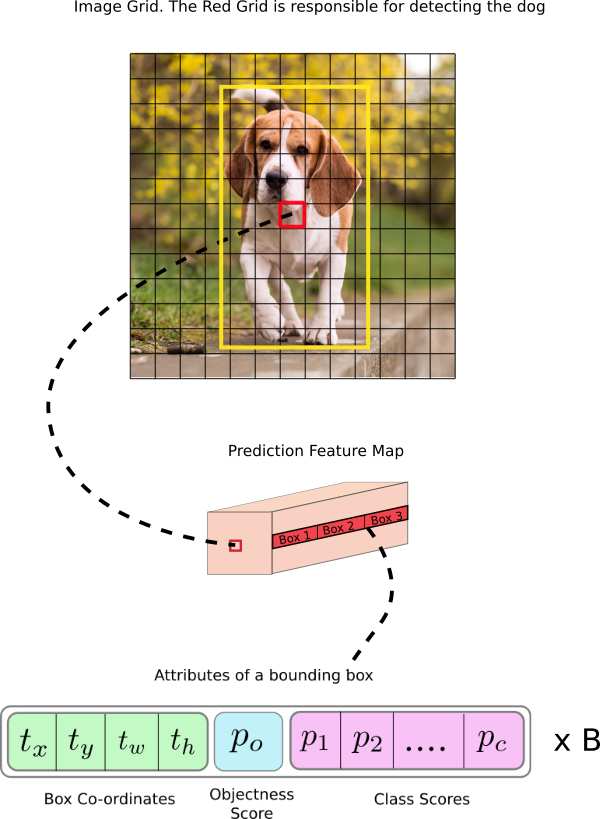

**So how do we `detect` the objects?** 

Answer is simple - we need to draw a box outside the region of interst. This box is called bounding box. In the above figure we can see a yellow box drawn containing a dog.

Yolo v3 detects objects in images across three scales. At each scale the input image is divided into S x S grid of cells. Where each of the grid cell is responsible for predicting B bounding boxes which is associated with C class probabilities of objects whose center falls inside the grid. 

Each bounding box is defined by (5 + C) attributes. The value of “5” is related to 5 bounding box attributes -

*   center defined by (tx, ty) 
*   height defined by th
*   width defined by tw
*   and one confidence score/objectness score po.

*Please note tx, ty, th, tw are with respect to the grid cell. Later on we will need to transform these with respect to the dimensions of the full image.*

The confidence score indicates the pobablity that the box contains an object. The confidence score is in the range of 0 – 1. The “C” is the number of classes.

Since we have S x S grid of cells, after running a single forward pass convolutional neural network to the whole image, YOLOv3 produces a 3-D tensor with the shape of [S, S, B * (5 + C)].

YOLOv3 was trained on the COCO dataset with C = 80 and B = 3. So, for the first prediction scale, after a single forward pass of CNN, the YOLOv3 outputs a tensor with the shape of [(13, 13, 3 * (5 + 80)].

**What if the object is bigger than the gird cell?**

The gird cell which contains the center of the object is responsible for predicting the bounding box. And the bounding box is made such that it can extend outside of the grid cell.

**And how many bounding boxes should we employ in our algorithm?**

Bounding boxes are also called anchor boxes. At each grid cell for each scale, yolo v3 can output 3 bounding boxes. This helps in predicting different bounding boxes for overlapping objects.

As there are 3 scales in the yolo v3 architecture figure below. And at each scale we can predict 3 bounding boxes. Therefore a total of 9 anchor boxes are used.

Size of these anchor boxes is a hyperparameter which this paper has quantified to - 
*   (10×13), (16×30), (33×23) for the first scale  
*   (30×61), (62×45), (59×119) for the second scale
*   (116×90), (156×198), (373×326) for the third scale

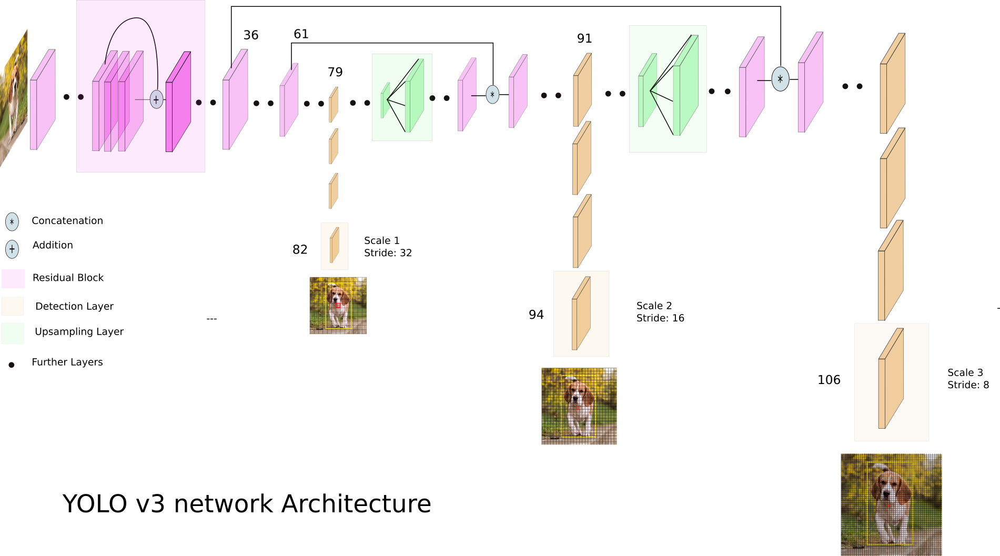

### Architecture explained

YOLOv3 makes detection in 3 different scales in order to accommodate different objects size by using strides of 32, 16 and 8. This means, if we feed an input image of size 416 x 416, YOLOv3 will make detection on the scale of 13 x 13, 26 x 26, and 52 x 52.

For the first scale, YOLOv3 downsamples the input image into 13 x 13 and makes a prediction at the 82nd layer. The 1st detection scale yields a 3-D tensor of size [13 x 13 x 255]. (255= 3*[5+80]); B = 3 which is number of anchor boxes for the current scale.

After that, YOLOv3 takes the feature map from layer 79 and applies one convolutional layer before upsampling it by a factor of 2 to have a size of 26 x 26. This upsampled feature map is then concatenated with the feature map from layer 61. The concatenated feature map is then subjected to a few more convolutional layers until the 2nd detection scale is performed at layer 94. The second prediction scale produces a 3-D tensor of size [26 x 26 x 255].

The same design is again performed one more time to predict the 3rd scale. The feature map from layer 91 is added one convolutional layer and is then concatenated with a feature map from layer 36. The final prediction layer is done at layer 106 yielding a 3-D tensor of size [52 x 52 x 255].

**Preprocessing the outputs**

In order to predict from all three scales in one go, we reshape all three scales as -
*   the first output tensor from     : [13 x 13 x 255] to [507 x 85]
*   the second output tensor from    : [26 x 26 x 255] to [2028 x 85]
*   the third output tensor from     : [52 x 52 x 255] to [8112 x 85]

And then all of these three tensors are concatenated to produce a single tensor of size [10647 x 85]. This single tensor contains all the information across the three scales for each of the 9 anchor boxes.

The second dimension of the tensor, i.e. 85, contains the predicted box coordinates w.r.t. the each grid cell. More concretely -
*   1,2 contains tx and ty i.e. box centers.
*   3,4 contains tw and th i.e. box height and box width.
*   5 contains po i.e. confidence score.
*   6-85 contains probability across each of the 80 classes.


**Converting bounding box coordinates (with respect to the grid) to bounding box coordinates with respect to the image**

To get a better idea - For each bounding box, yolo predicts 4 coordinates, tx, ty, tw, th. The tx and ty are the bounding box’s center coordinates relative to the grid cell (grid cell where the center lies), and the tw and th are the bounding box’s shape, width and height, respectively.

We need to convert the coordinates (tx, ty, tw, th) of the object described by red grid box to yellow anchor box coordinates (bx, by, bw, bh) in the Image grid figure above. Yellow anchor box coordinates are with respect to top left corner (origin) of the input image.

We need to do following computions for this transformation -

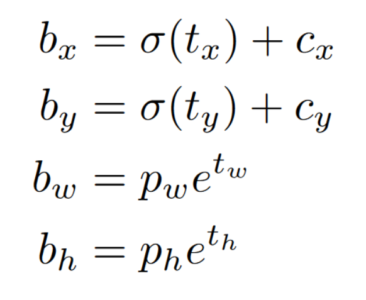

The cx and cy are coordinates of the top left corner of the grid cell  with respect to top left corner of the input image.
The pw and ph are the anchor’s pre-defined width and pre-defined height, respectively. 

The figure below describes this transformation in more detail-

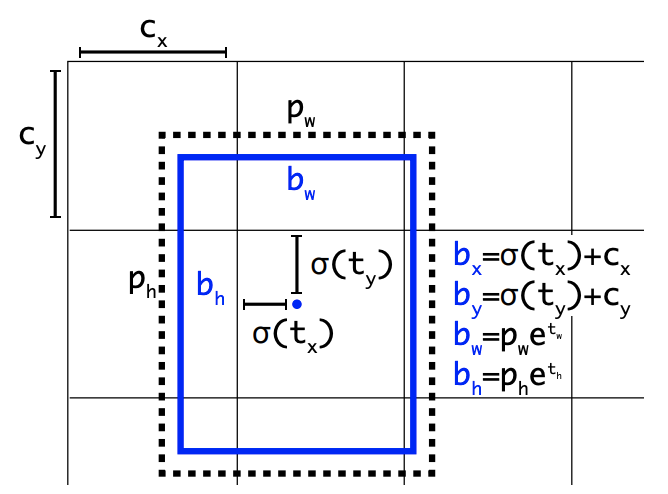

Plese note these coordinates bx, and by  of the anchor boxes are center points of the bounding box. We are going to process these points later to output the top left corner of the bounding box.

**Let us pause here to make this model-architecture and load pre-trained weights.**

In [1]:
#Importing the libraries

import tensorflow as tf
import numpy as np
from tensorflow import keras
import cv2

from tensorflow.keras.layers import BatchNormalization, Conv2D, Input, ZeroPadding2D, LeakyReLU, UpSampling2D
from tensorflow.keras import Model

tf.__version__

'2.8.0'

We are going to download this blueprint below-

In [2]:
#Downloading Yolo v3 model architecture blueprint:
!wget https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov3.cfg \
      -O /tmp/yolov3.cfg

--2022-03-01 07:41:22--  https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov3.cfg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8342 (8.1K) [text/plain]
Saving to: ‘/tmp/yolov3.cfg’

/tmp/yolov3.cfg     100%[===================>]   8.15K  --.-KB/s    in 0s      

2022-03-01 07:41:22 (64.3 MB/s) - ‘/tmp/yolov3.cfg’ saved [8342/8342]



We are also going to download the pretrained weights -

In [3]:
#Downloading Yolo v3 weights:
!wget https://pjreddie.com/media/files/yolov3.weights \
      -O /tmp/yolov3.weights

--2022-03-01 07:41:22--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘/tmp/yolov3.weights’

/tmp/yolov3.weights 100%[===================>] 236.52M  45.6MB/s    in 5.6s    

2022-03-01 07:41:28 (42.4 MB/s) - ‘/tmp/yolov3.weights’ saved [248007048/248007048]



YOLOv3 was trained on the COCO dataset with Classes = 80 and Bounding Boxes = 3. Downloading the class names -

In [4]:
#Downloading Class Names
!wget https://raw.githubusercontent.com/pjreddie/darknet/master/data/coco.names \
      -O /tmp/coco.names

--2022-03-01 07:41:28--  https://raw.githubusercontent.com/pjreddie/darknet/master/data/coco.names
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 625 [text/plain]
Saving to: ‘/tmp/coco.names’

/tmp/coco.names     100%[===================>]     625  --.-KB/s    in 0s      

2022-03-01 07:41:29 (41.3 MB/s) - ‘/tmp/coco.names’ saved [625/625]



Writing a function to parse the yolo configuration file. This configuration file contains the blue-print of the architecture.

In [5]:
# writing a function to parse the yolo configuration file. This configuration file contains the blue-print of the architecture.

def parse_cfg(cfg_file):
  with open(cfg_file, 'r') as file:
    lines = [line.rstrip('\n') for line in file if line != '\n' and line[0] != '#']

    holder = {}
    blocks = []

    for line in lines:
      if line[0] == '[':
        line = "type =" +line[1:-1].rstrip()
        if len(holder) !=0:
          blocks.append(holder)
          holder = {}
      key, value = line.split('=')
      holder[key.lstrip().rstrip()] = value.rstrip().lstrip()
    blocks.append(holder)

    return blocks
  

In [6]:
parse_cfg("/tmp/yolov3.cfg")

[{'angle': '0',
  'batch': '64',
  'burn_in': '1000',
  'channels': '3',
  'decay': '0.0005',
  'exposure': '1.5',
  'height': '608',
  'hue': '.1',
  'learning_rate': '0.001',
  'max_batches': '500200',
  'momentum': '0.9',
  'policy': 'steps',
  'saturation': '1.5',
  'scales': '.1,.1',
  'steps': '400000,450000',
  'subdivisions': '16',
  'type': 'net',
  'width': '608'},
 {'activation': 'leaky',
  'batch_normalize': '1',
  'filters': '32',
  'pad': '1',
  'size': '3',
  'stride': '1',
  'type': 'convolutional'},
 {'activation': 'leaky',
  'batch_normalize': '1',
  'filters': '64',
  'pad': '1',
  'size': '3',
  'stride': '2',
  'type': 'convolutional'},
 {'activation': 'leaky',
  'batch_normalize': '1',
  'filters': '32',
  'pad': '1',
  'size': '1',
  'stride': '1',
  'type': 'convolutional'},
 {'activation': 'leaky',
  'batch_normalize': '1',
  'filters': '64',
  'pad': '1',
  'size': '3',
  'stride': '1',
  'type': 'convolutional'},
 {'activation': 'linear', 'from': '-3', 'type'

Now we are going to connect the parsed structure to create the full yolo v3 network architecture.

In [7]:
def YOLOv3net(cfgfile, model_size, num_classes):

  blocks = parse_cfg(cfgfile)

  outputs = {}
  output_filters = []
  filters = []
  out_pred = []
  scale = 0

  inputs = input_image = Input(shape = model_size)
  inputs = inputs/255.0

  for i,block in enumerate(blocks[1:]):

    #Convolutional Block
    if (block['type'] =='convolutional'):
      activation = block['activation']
      filters = int(block['filters'])
      kernel_size = int(block['size'])
      strides = int(block['stride'])

      if strides > 1:
        inputs = ZeroPadding2D(((1,0),(1,0)))(inputs) # peculiar padding as darknet prefer left and top

      inputs = Conv2D(filters, 
                      kernel_size, 
                      strides = strides,
                      padding = 'valid' if strides > 1 else 'same', name = 'conv_'+str(i),
                      use_bias = False if ('batch_normalize' in block) else True)(inputs) 

      if 'batch_normalize' in block:
        inputs = BatchNormalization(name = 'bnorm_'+ str(i))(inputs)
        inputs = LeakyReLU(alpha =0.1, name = 'leaky_'+ str(i))(inputs)

    #Upsampling Block
    elif (block['type'] == 'upsample'):
      stride = int(block['stride'])
      inputs = UpSampling2D(stride)(inputs)

    #Routing Block
    elif (block['type'] == 'route'):
      block['layers'] = block['layers'].split(',')
      start = int(block['layers'][0])

      if len(block['layers'])> 1:
        end = int(block['layers'][1])
        filters = output_filters[i+start] + output_filters[end] #check this again; there might be a problem
        inputs = tf.concat([outputs[i+start], outputs[end]], axis = -1)
        
      else:
        filters = output_filters[i+start]
        inputs = outputs[i+start]

    #ShortCut Block
    elif (block['type']=='shortcut'):
      from_ = int(block['from'])
      inputs = outputs[i-1] + outputs[i+from_] #add features from previous layer to the one specified in from_

    #YOLO Block
    elif (block['type']=='yolo'):
      mask = block['mask'].split(',')
      mask = [int(x) for x in mask]
      anchors = block['anchors'].split(',')
      anchors = [int(x) for x in anchors]
      anchors = [(anchors[i], anchors[i+1]) for i in range(0,len(anchors), 2)]
      anchors = [anchors[i] for i in mask]
      n_anchors = len(anchors)

      out_shape = inputs.get_shape().as_list() #we need to reshape the YOLOv3 output to the form of [None, B * grid size * grid size, 5 + C]. 
      #The B is the number of anchors and C is the number of classes.
      inputs = tf.reshape(inputs, [-1, n_anchors * out_shape[1] * out_shape[2], 5 + num_classes])

      box_centers = inputs[:, :, 0:2]
      box_shapes = inputs[:, :, 2:4]
      confidence = inputs[:, :, 4:5]
      classes = inputs[:, :, 5:]

      box_centers = tf.sigmoid(box_centers)
      confidence = tf.sigmoid(confidence)
      classes = tf.sigmoid(classes)

      anchors = tf.tile(anchors, (out_shape[1] * out_shape[2], 1))
      box_shapes = tf.exp(box_shapes) * tf.cast(anchors, dtype=tf.float32)

      x = tf.range(out_shape[1], dtype = tf.float32)
      y = tf.range(out_shape[2], dtype = tf.float32)
      
      cx, cy = tf.meshgrid(x, y)
      cx = tf.reshape(cx, (-1, 1))
      cy = tf.reshape(cy, (-1, 1))
      cxy = tf.concat([cx, cy], axis=-1)
      cxy = tf.tile(cxy, [1, n_anchors])
      cxy = tf.reshape(cxy, [1, -1, 2])

      strides = (input_image.shape[1] // out_shape[1], input_image.shape[2] // out_shape[2])
                       
      box_centers = (box_centers + cxy) * strides

      prediction = tf.concat([box_centers, box_shapes, confidence, classes], axis=-1)

      if scale:
          out_pred = tf.concat([out_pred, prediction], axis=1)
      else:
          out_pred = prediction
          scale = 1

    outputs[i] = inputs
    output_filters.append(filters)

  model = Model(input_image, out_pred)
  model.summary()
  return model



We are also going to input pretrained weights to this architecture. This could be done with the following function -

In [8]:
def load_weights(model, cfgfile, weightfile):

  fp = open(weightfile, 'rb') #opens the weight file
  np.fromfile(fp, dtype = np.int32, count = 5) #skips top 5 header values

  blocks = parse_cfg(cfgfile) #rest all are weights
  for i, block in enumerate(blocks[1:]):

    if(block['type'] == 'convolutional'):

      conv_layer = model.get_layer('conv_' + str(i))
      print("layer :  ", i+1 , conv_layer)

      filters = conv_layer.filters
      k_size = conv_layer.kernel_size[0]
      in_dim = conv_layer.input_shape[-1]

      if "batch_normalize" in block:

        norm_layer = model.get_layer('bnorm_' + str(i))
        print("layer :  ", i+1, norm_layer)
        # size = np.prod(norm_layer.get_weights()[0].shape)

        bn_weights = np.fromfile(fp, dtype = np.float32, count = 4 * filters)  # tf [gamma, beta, mean, variance]
        bn_weights = bn_weights.reshape((4,filters))[[1,0,2,3]]

      else:

        conv_bias = np.fromfile(fp, dtype = np.float32, count = filters)

      conv_shape =(filters, in_dim, k_size, k_size ) # darknet shape (out_dim, in_dim, height, width)
      conv_weights = np.fromfile(fp, dtype =np.float32, count = np.product(conv_shape))
      conv_weights = conv_weights.reshape(conv_shape).transpose([2,3,1,0]) # tf shape (height, width, in_dim, out_dim)

      if "batch_normalize" in block:
        norm_layer.set_weights(bn_weights)
        conv_layer.set_weights([conv_weights])
      else:
        conv_layer.set_weights([conv_weights, conv_bias])

  assert len(fp.read()) ==0 #failed to read all data
  fp.close()

Loading Class names of the coco dataset.

In [9]:
def load_class_names(file_name):
    with open(file_name, 'r') as f:
        class_names = f.read().splitlines()
    return class_names

Each input image has to be resized to the input size of the model.

In [10]:
def resize_image(inputs, modelsize):
    inputs= tf.image.resize(inputs, modelsize)
    return inputs

In [11]:
model_size = (416, 416,3)
num_classes = 80
class_name = '/tmp/coco.names'
max_output_size = 40
max_output_size_per_class= 20
iou_threshold = 0.5
confidence_threshold = 0.5

cfgfile = '/tmp/yolov3.cfg'
weightfile = '/tmp/yolov3.weights'

In [12]:
model = YOLOv3net(cfgfile,model_size,num_classes)
load_weights(model,cfgfile,weightfile)
class_names = load_class_names(class_name)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 416, 416, 3  0           []                               
                                )]                                                                
                                                                                                  
 tf.math.truediv (TFOpLambda)   (None, 416, 416, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv_0 (Conv2D)                (None, 416, 416, 32  864         ['tf.math.truediv[0][0]']        
                                )                                                                 
                                                                                              

In [13]:
from tensorflow.keras.utils import plot_model
plot_model(model, to_file='model.png',show_shapes=True, show_layer_names=True)

We can see that output size of the final layer of the model is [None, 10647, 85] which is inline with what we outlined in the discussion above. 

**But the above tensor suggests there could be a maximum of 10647 boxes for a 416 x 416 image.**

As we are making predictions across 3 scales, it is for sure that mutliple anchor boxes, of different sizes, will be predicted for same detected object. And there could be multiple objects. The problem is how do we decide which one of these bounding boxes is the right one. 

This problem is tackled by a concept called **Non Maximum Supression.** NMS is used to clean up the detections and make sure that only a single bounding box per object is outputted. It works as following-

1.  The first step of NMS is to discard all the predictions boxes which have confidence score less than a certain threshold value. Let’s say the confidence threshold is set to 0.5, so all bounding boxes with confidence score is less than or equal to 0.5, will be discarded.

2.   Sort all the remaining bounding boxes in decending order of the confidence scores.

3.   Select the bounding box with highest confidence score. And find all the bounding boxes which have a high IOU (intersection over union) with the box. Let's say we have IOU threshold of 0.5. We are going to discard all the boxes which have IOU greater than 0.5 with respect to the current selected bounding box.

4.  Next we are going to select the next bouding box with highest confidence score amongst the remaining bounding boxes and then repeat step 3. This step is repeated till we have gone through all of the bounding boxes.


Lets code this now!


In [14]:
def non_max_suppression(inputs, model_size, max_output_size, max_output_size_per_class, iou_threshold, confidence_threshold):

  bbox, confs, class_prob = tf.split(inputs, [4,1,-1], axis = -1)
  bbox = bbox/model_size[0]

  scores = confs * class_prob

  boxes, scores, classes, valid_detections = tf.image.combined_non_max_suppression(
      boxes = tf.reshape(bbox, (tf.shape(bbox)[0], -1, 1, 4)),
      scores = tf.reshape(scores, (tf.shape(scores)[0], -1, tf.shape(scores)[-1])),
      max_output_size_per_class = max_output_size_per_class,
      max_total_size = max_output_size,
      iou_threshold = iou_threshold,
      score_threshold = confidence_threshold
  )

  return boxes, scores, classes, valid_detections

The yolo algorithm returns bounding boxes in the form of (bx, by, bw, bh). The bx and by are the center coordinates of the boxes and bw and bh are the box shape (width and height). Generally, to draw boxes, we use the top-left coordinate (x1, y1) and the box shape (width and height). To do this just simply convert them using this simple relation:

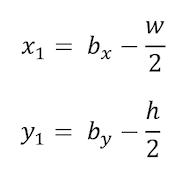

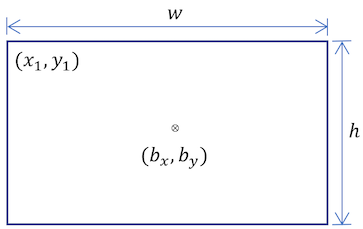

In [15]:
def output_boxes(inputs,model_size, max_output_size, max_output_size_per_class, 
                 iou_threshold, confidence_threshold):
    center_x, center_y, width, height, confidence, classes = tf.split(inputs, [1, 1, 1, 1, 1, -1], axis=-1)
    
    top_left_x = center_x - width / 2.0
    top_left_y = center_y - height / 2.0
    bottom_right_x = center_x + width / 2.0
    bottom_right_y = center_y + height / 2.0
    
    inputs = tf.concat([top_left_x, top_left_y, bottom_right_x,
                        bottom_right_y, confidence, classes], axis=-1)
    
    boxes_dicts = non_max_suppression(inputs, model_size, max_output_size, 
                                      max_output_size_per_class, iou_threshold, confidence_threshold)
    return boxes_dicts

One last function to draw the output boxes with classes.

In [16]:
def draw_outputs(img, boxes, objectness, classes, nums, class_names):
    boxes, objectness, classes, nums = boxes[0], objectness[0], classes[0], nums[0]
    boxes=np.array(boxes)
    for i in range(nums):
        x1y1 = tuple((boxes[i,0:2] * [img.shape[1],img.shape[0]]).astype(np.int32))
        x2y2 = tuple((boxes[i,2:4] * [img.shape[1],img.shape[0]]).astype(np.int32))
        img = cv2.rectangle(img, (x1y1), (x2y2), (255,0,0), 1)
        img = cv2.putText(img, '{} {:.4f}'.format(
            class_names[int(classes[i])], objectness[i]),
                          (x1y1), cv2.FONT_HERSHEY_PLAIN, 1, (0, 0, 255), 2)
    return img

Now let's upload a picture and see it this works...

In [17]:
#uploading a pic
from google.colab import files
from google.colab.patches import cv2_imshow

image = files.upload()
image = list(image.keys())[0]
image = cv2.imread(image)

name = 'test.jpg'    
cv2.imwrite(name, image)

Saving biking-gbd7a195cf_1280.jpg to biking-gbd7a195cf_1280.jpg


True

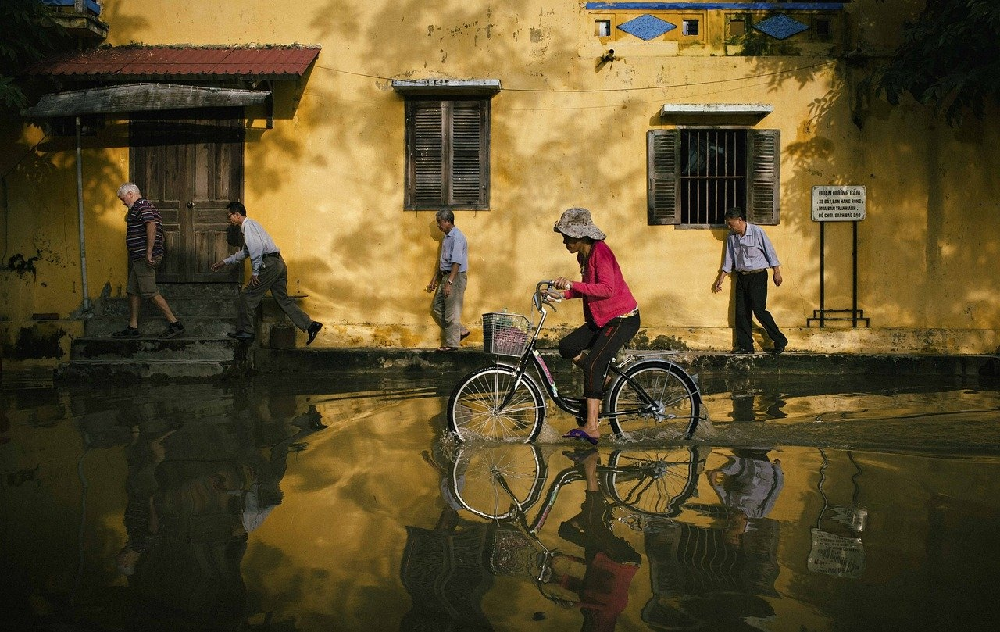

In [18]:
#printing the uploaded pic 
img = cv2.imread(name)
cv2_imshow(img)

In [19]:
#detecting the objects on the uploaded pic and drawing anchor boxes
img = tf.image.decode_image(open(name, 'rb').read(), channels=3)
img = tf.expand_dims(img, 0)

resized_frame = resize_image(img, (model_size[0],model_size[1]))
pred = model.predict(resized_frame)
boxes, scores, classes, nums = output_boxes(
        pred, model_size,
        max_output_size=max_output_size,
        max_output_size_per_class=max_output_size_per_class,
        iou_threshold=iou_threshold,
        confidence_threshold=confidence_threshold)


img = cv2.imread(name)
img = draw_outputs(img, boxes, scores, classes, nums, class_names)
cv2.imwrite('output.jpg', img)

True

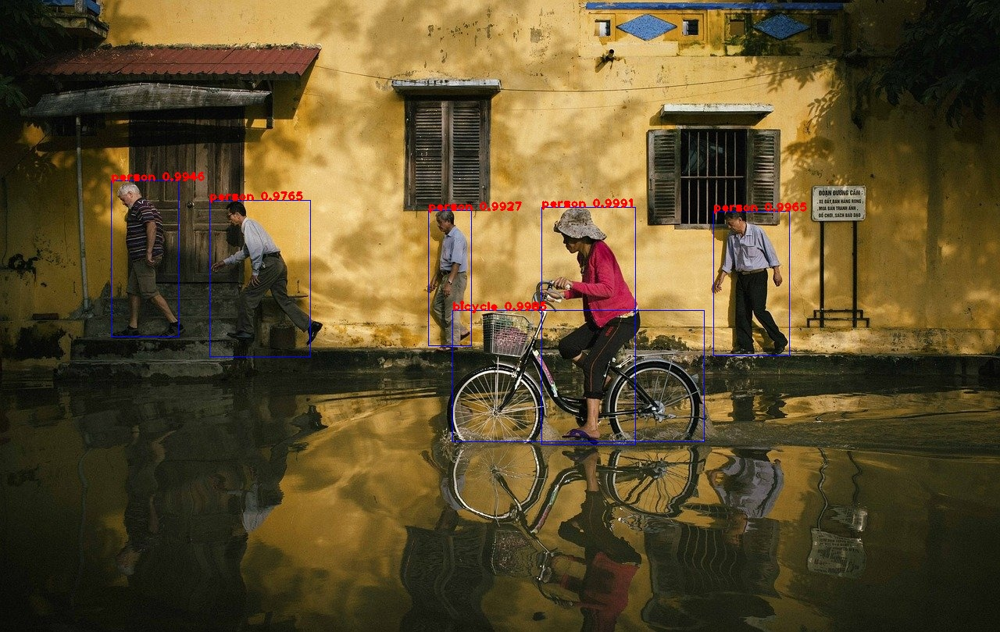

In [20]:
#printing the pic with detected objects
img = cv2.imread('output.jpg')
cv2_imshow(img)

**Further improvements-**

*   Modify this code to work for vidoes.
*   Try to train this model on a custom dataset.

### Credits

All of this work is heavily inspired from -

*   https://arxiv.org/abs/1804.02767
*   https://blog.paperspace.com/how-to-implement-a-yolo-object-detector-in-pytorch/
*   https://machinelearningspace.com/yolov3-tensorflow-2-part-1/


